In [2]:
import ribasim
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path
import pandas as pd
import geopandas as gpd
import xarray as xr
import ugrid as ug
import ugrid as ugrid
from ugrid import UGrid, UGridNetwork1D
import scipy
import dask
import netCDF4 as nc
import xugrid as xu
import xugrid as xugrid
from typing import Optional
from mpl_toolkits.mplot3d import Axes3D
from shapely.geometry import Point, LineString



https://deltares.github.io/xugrid/api/xugrid.Ugrid1d.html
https://github.com/Deltares/Ribasim
https://github.com/Deltares/xugrid
https://github.com/Deltares/UGridPy

# Basale plots
https://deltares.github.io/xugrid/examples/quick_overview.html

In [3]:
nc_path =  r"D:\Users\Bruijns\Documents\TKI Ribasim\Modellen\HogeRaam\fm\fm\output\Hooge Raam_map.nc"
map_file = xr.open_dataset(nc_path)

ds = xr.open_dataset(nc_path)

In [4]:
t = 35
uds = xu.UgridDataset(ds)
waterdepth = uds["mesh1d_s1"][t]
network1d_edge_nodes = uds["network1d_edge_length"][t]

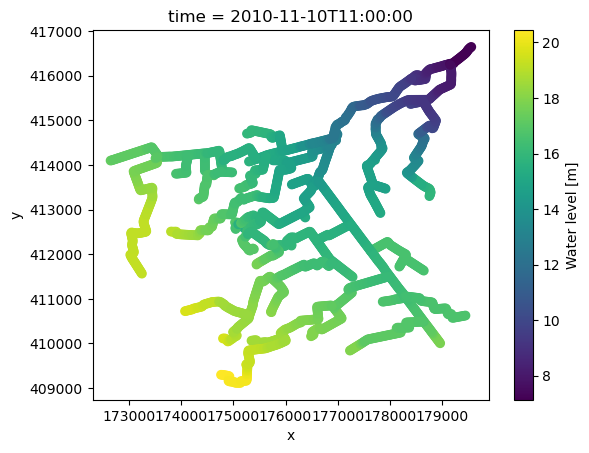

In [5]:
waterdepth.ugrid.plot(cmap="viridis")
# plt.xlim(165000, 166000)

# Q(h)-relations

In [6]:
def plot_Q_h(Q, h, edges, edge_n, threeD = False):
    """
    Plot the Q of a specified edge, and the corresponding h of the nodes  
    
    Parameters
    ----------
    Q : mesh1d_q1
    h : mesh1d_s1
    edges : mesh1d_edge_nodes
    edge_n : edge number to be looked into
    
    Returns
    ----------
    Plots
    """
    
    start_node = np.array(edges[edge_n])[0] - 1 #minus one since it starts counting at 1 instead of 0
    end_node = np.array(edges[edge_n])[1] - 1 #minus one since it starts counting at 1 instead of 0  
                        
    q1 = Q[:, edge_n] #dicharge at the defined edge_n
    h_up = h[:, start_node]
    h_down = h[:, end_node]    
    
    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
    
    #upper left, discharge
    q1.plot(ax = axs[0,0], label = 'Discharge [m3/s]')
    axs[0,0].legend()
    axs[0,0].grid()
    axs[0,0].set_title('Discharge')
    
    
    #upper right, waterlevels
    h_up.plot(ax = axs[0,1], label='Waterdepth_upstream [mNAP]')
    h_down.plot(ax = axs[0,1], label='Waterdepth_downstream [mNAP]')
    axs[0,1].legend()
    axs[0,1].grid()
    axs[0,1].set_title('Water levels')
    
    
    #middle left, waterlevel upstream
    scatter = axs[1,0].scatter(x = h_up,
                               y = q1,
                               c =plt.cm.viridis(np.linspace(0, 1, len(h_up))),
                               alpha = 0.5)
    axs[1,0].set_xlabel('Waterdepth_upstream [mNAP]')
    axs[1,0].set_ylabel('Discharge [m3/s]')
    axs[1,0].grid()
    axs[1,0].set_title('Q(h) relation with upstream node')
    fig.colorbar(scatter, ax=axs[1,0], label = 'Relative time stamp')

    
    #middle right, waterlevel downstream
    scatter = axs[1,1].scatter(x = h_down,
                               y = q1,
                               c =plt.cm.viridis(np.linspace(0, 1, len(h_down))),
                               alpha = 0.5)
    axs[1,1].set_xlabel('Waterdepth_upstream [mNAP]')
    axs[1,1].set_ylabel('Discharge [m3/s]')
    axs[1,1].grid()
    axs[1,1].set_title('Q(h) relation with downstream node')
    fig.colorbar(scatter, ax=axs[1,1], label = 'Relative time stamp')


    #lower left, Q(h)-relation downstream
    scatter = axs[2,0].scatter(x = h_down,
                               y = h_up,
                               c = q1,
                               alpha = 0.2)
    axs[2,0].set_xlabel('Waterdepth_upstream [mNAP]')
    axs[2,0].set_ylabel('Waterdepth_downstream [mNAP]')
    axs[2,0].grid()
    axs[2,0].set_title('Q(h) relation')
    fig.colorbar(scatter, ax=axs[2,0], label = 'Discharge [m3/s]')

    
        
    if threeD == True:
        size = 0.01
        axs[2,1].set_axis_off()
        
        ax = fig.add_subplot(3, 2, 6, projection='3d')
        colors = q1 / np.max(q1)  # normalize q1 values to [0, 1] range

        ax.bar3d(x = np.array(h_up),
                       y = np.array(h_down),
                       z = np.zeros_like(q1),
                       dx = np.ones_like(h_up)*size,
                       dy = np.ones_like(h_up)*size,
                       dz = np.array(q1),
                       color=plt.cm.viridis(colors),
                       alpha = 0.2)
        # ax.view_init(elev=30, azim=45)
        # Set the axis labels
        ax.set_xlabel('Waterdepth_upstream [mNAP]')
        ax.set_ylabel('Waterdepth_downstream [mNAP]')
        ax.set_zlabel('Discharge [m3/s]')

        # Adjust the viewing angle
        ax.view_init(roll=0)

        # Add grid lines
        ax.grid(True)
    
    fig.patch.set_facecolor('none')
    plt.tight_layout()
    # plt.show()
    
    
    #check whether the coordinates of the the edges and node correspond
    snxl, snyl = h[:, start_node].mesh1d_node_x.values, h[:, start_node].mesh1d_node_y.values
    enxl, enyl = h[:, end_node].mesh1d_node_x.values, h[:, end_node].mesh1d_node_y.values
    exl, eyl = Q[:, edge_n].mesh1d_edge_x.values, Q[:, edge_n].mesh1d_edge_y.values
    
    x, y = True, True
    
    if exl > np.mean([snxl, enxl])+1 or exl < np.mean([snxl, enxl])-1:
        x = False
    elif eyl > np.mean([snyl, enyl])+1 or eyl < np.mean([snyl, enyl])-1:
        y = False
        
    if x == False or y == False:    
        print('x =', x)
        print('y =', y)
        print('Edge x location: ', int(Q[:, edge_n].mesh1d_edge_x.values))
        print('Edge y location: ', int(Q[:, edge_n].mesh1d_edge_y.values))
        print()
        print('Start node x location: ', int(h[:, start_node].mesh1d_node_x.values))
        print('Start node y location: ', int(h[:, start_node].mesh1d_node_y.values))
        print()
        print('End node x location: ', int(h[:, end_node].mesh1d_node_x.values))
        print('End node y location: ', int(h[:, end_node].mesh1d_node_y.values))
    else:
        print('Coordinates of the nodes and edges are likely to be correct')
    
                           
                    

Coordinates of the nodes and edges are likely to be correct


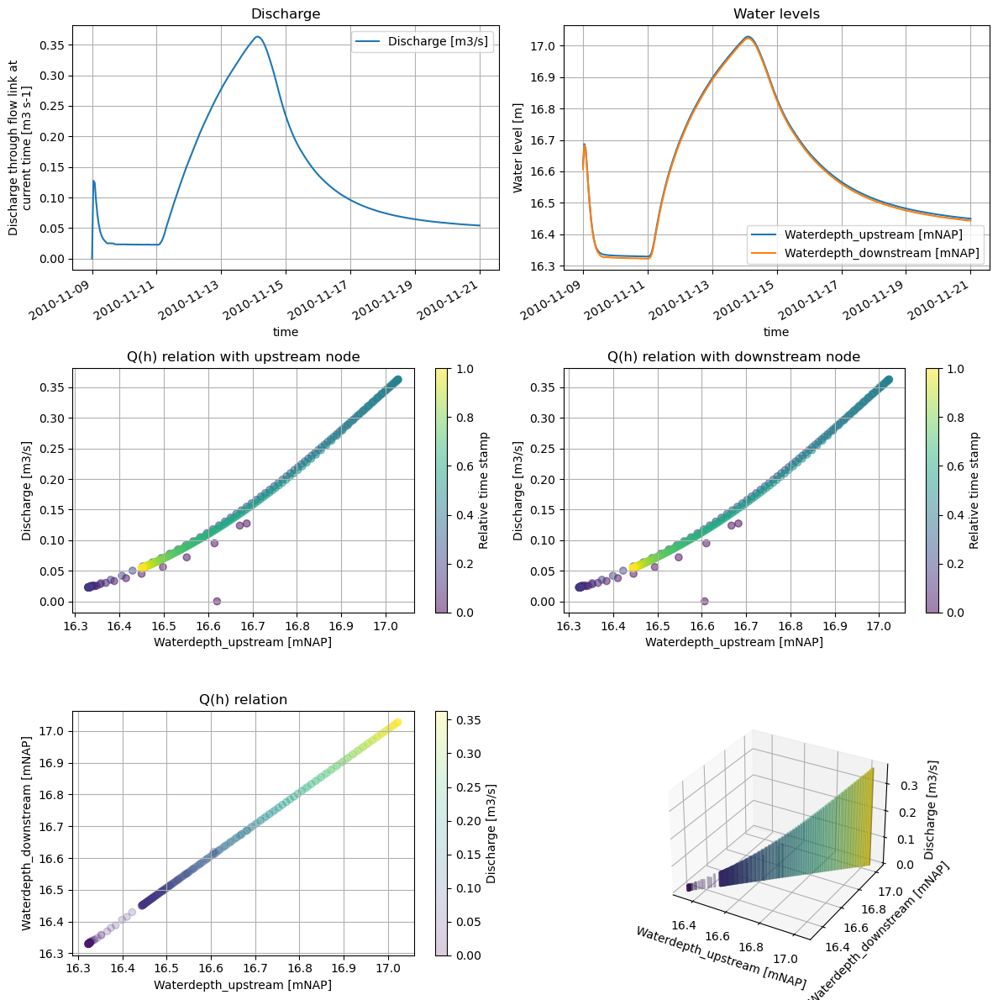

In [7]:
plot_Q_h(Q = map_file['mesh1d_q1'],
         h = map_file['mesh1d_s1'],
         edges = map_file['mesh1d_edge_nodes'],
         edge_n = 3,
         threeD = True)

Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are l

C:\Users\Bruijns\AppData\Local\Temp\ipykernel_11896\2666638786.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))


Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct
Coordinates of the nodes and edges are likely to be correct


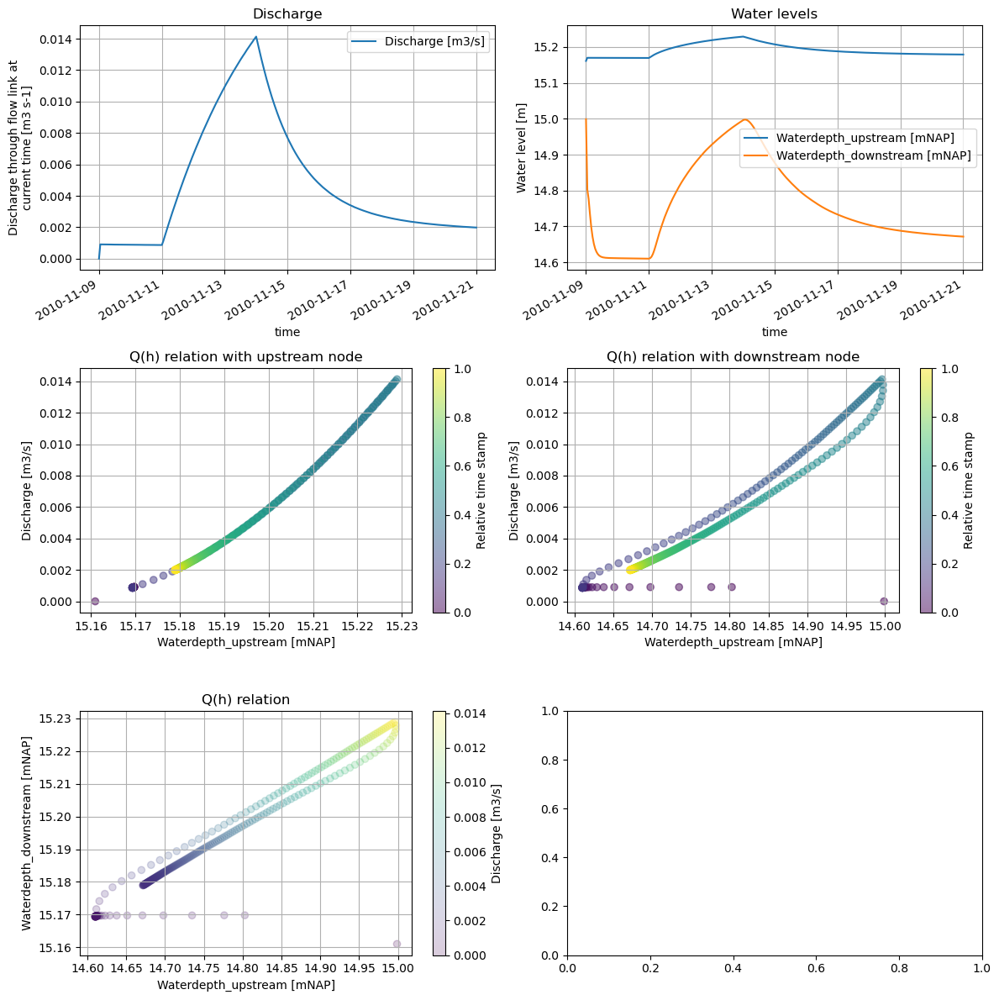

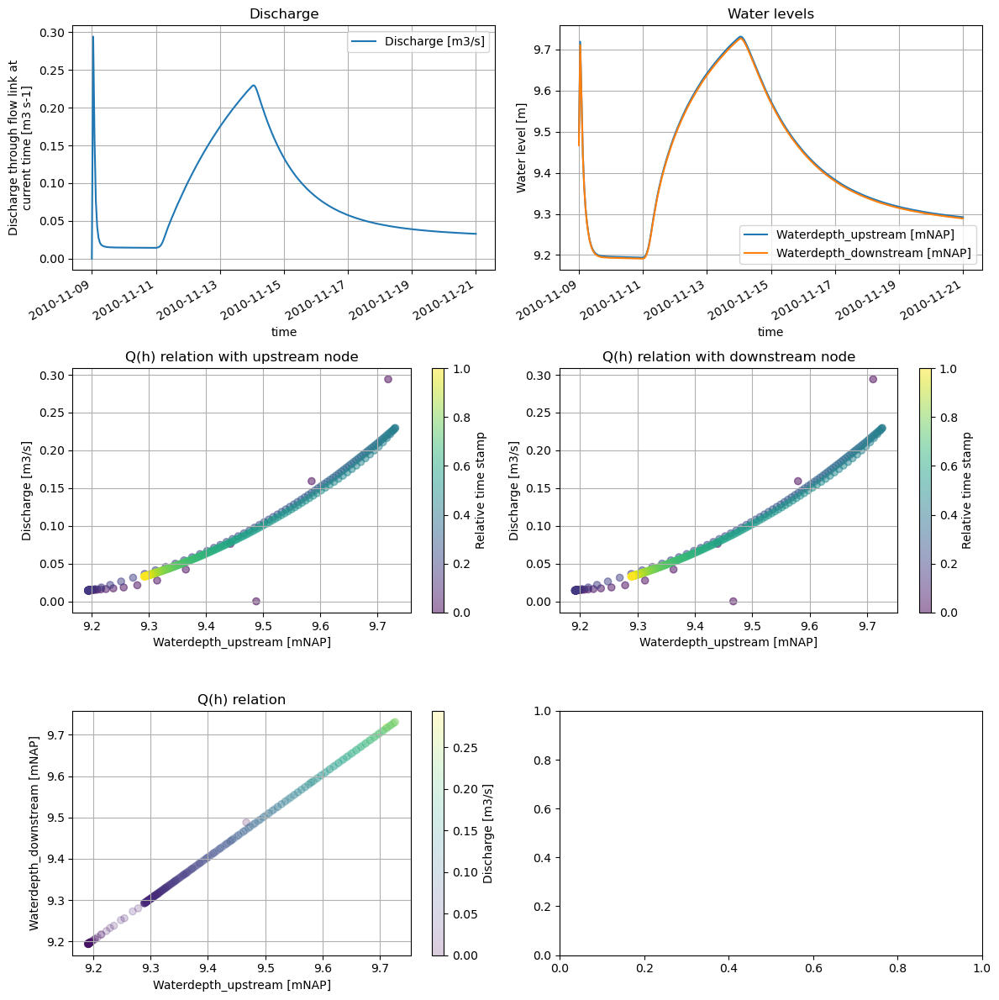

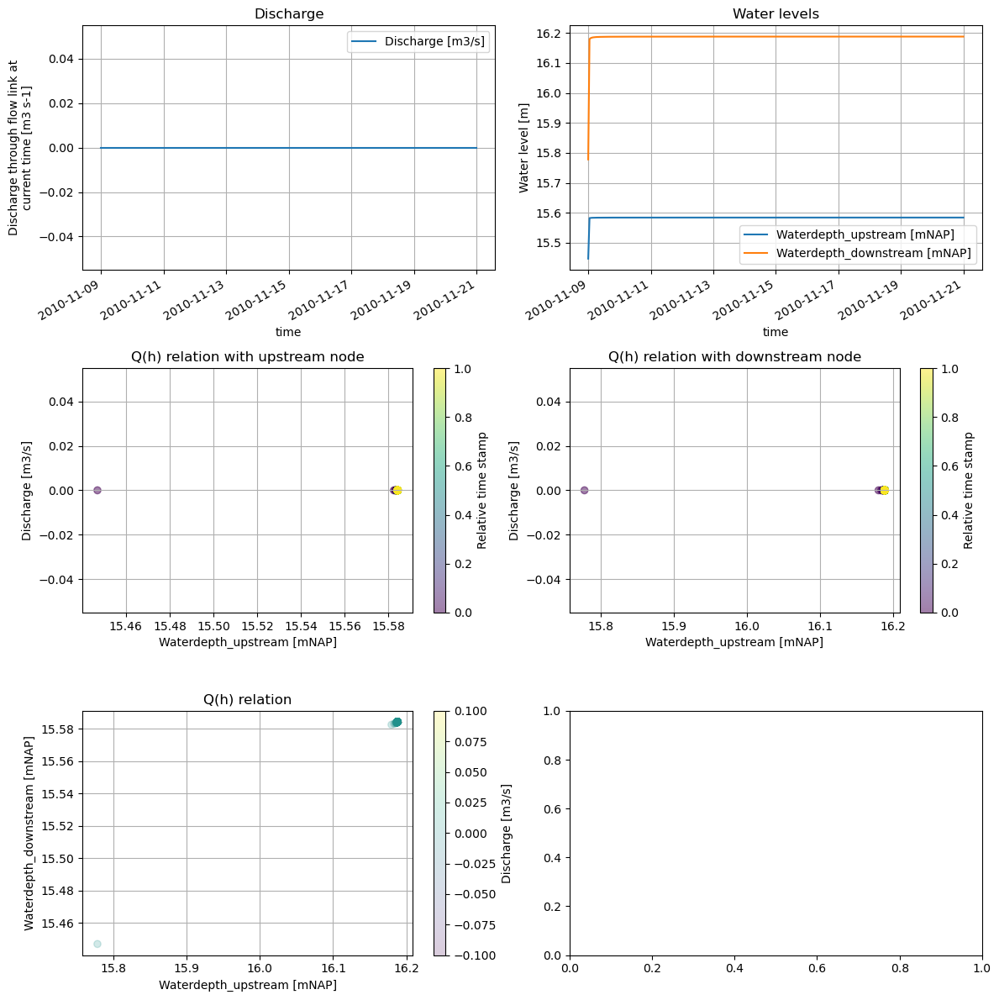

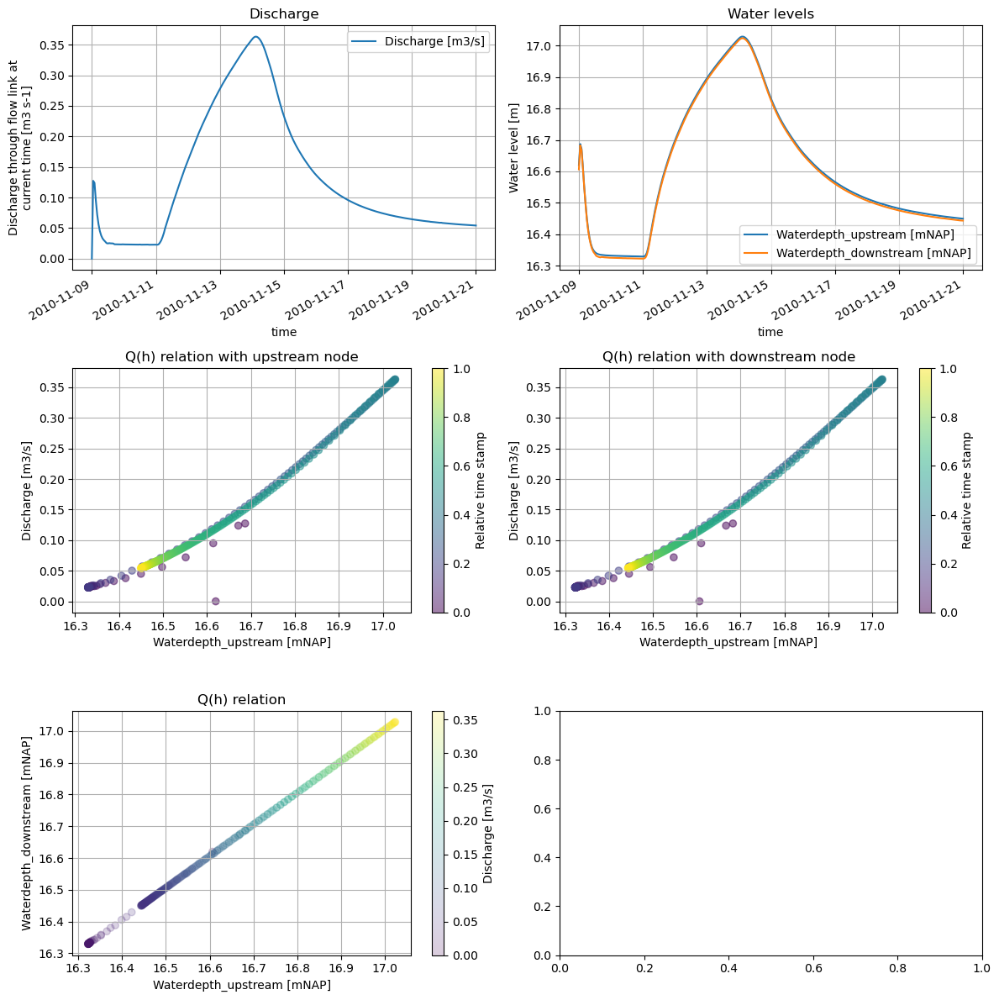

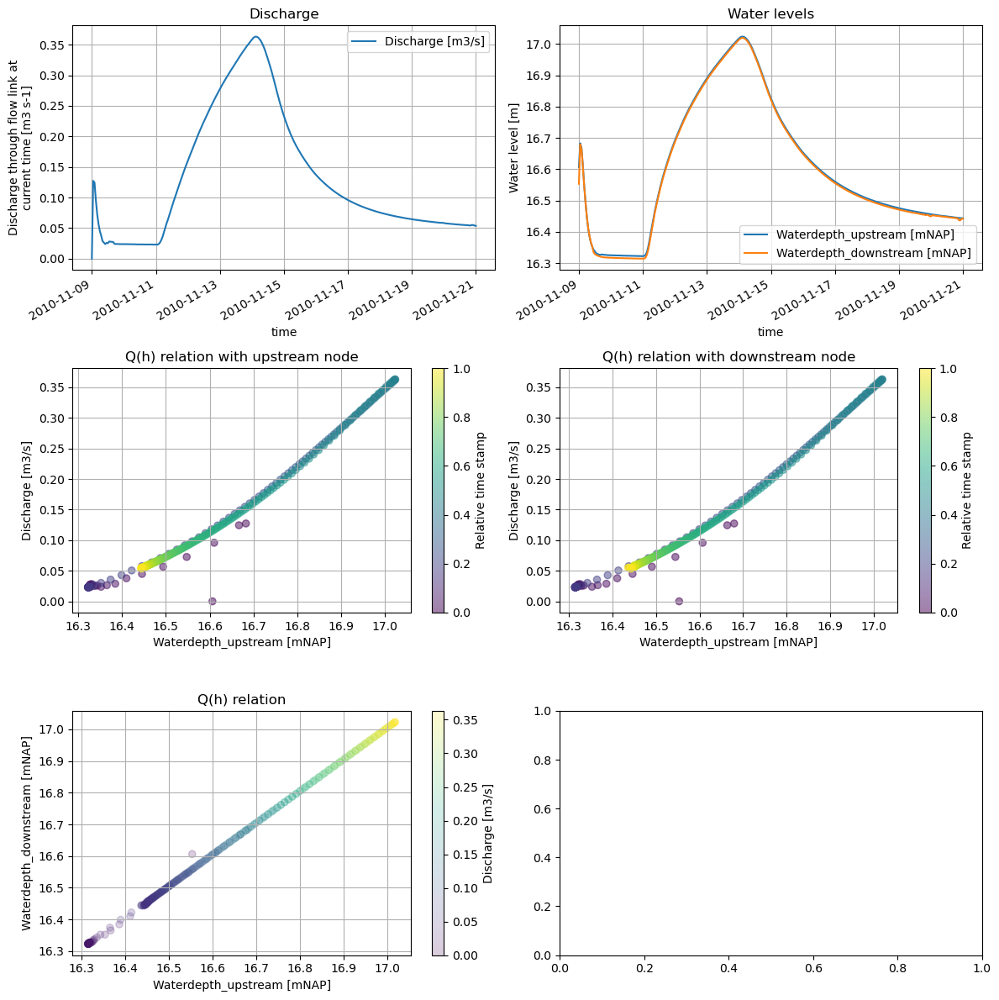

...

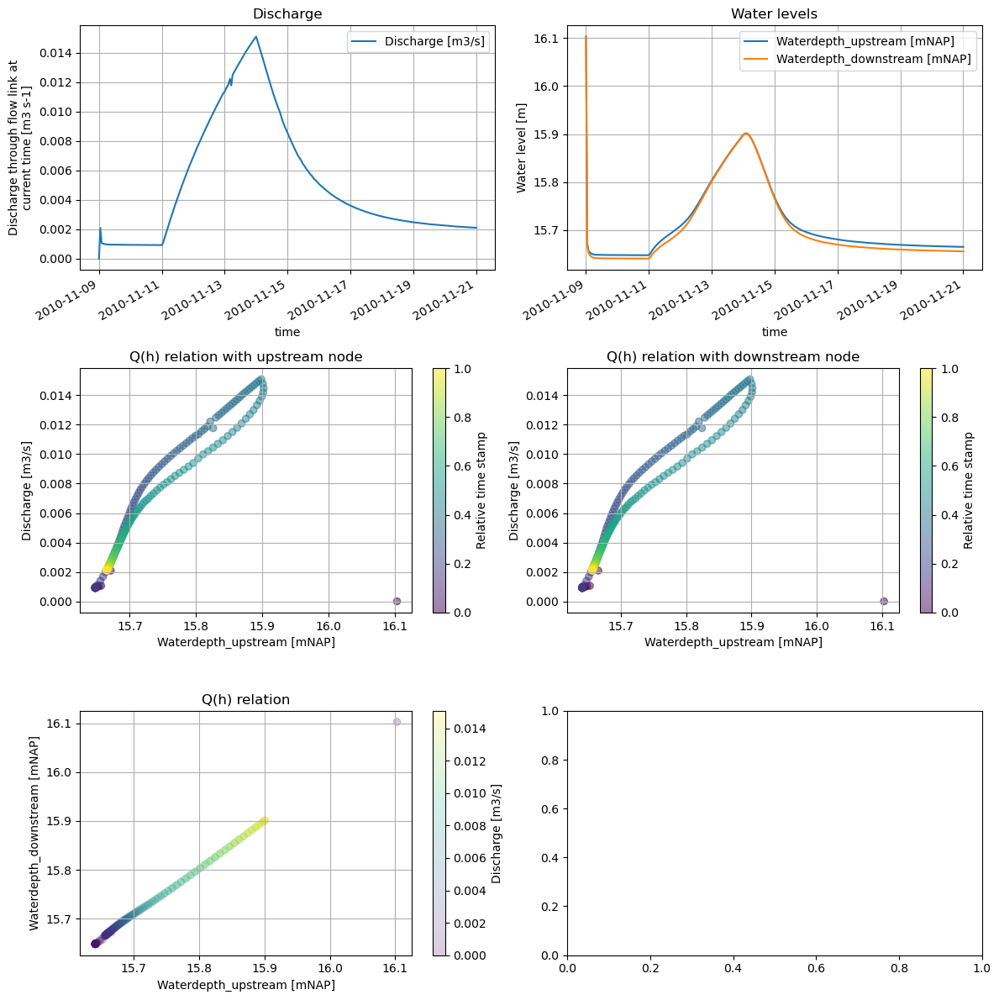

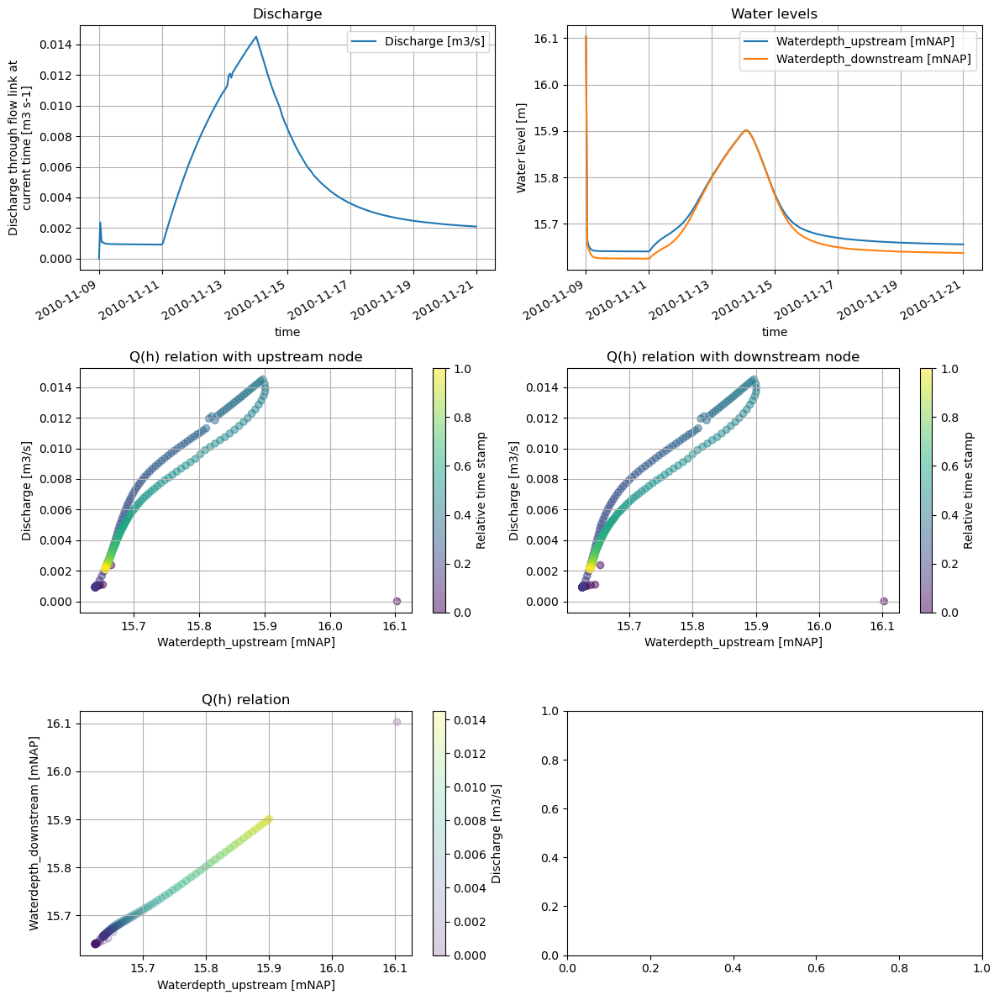

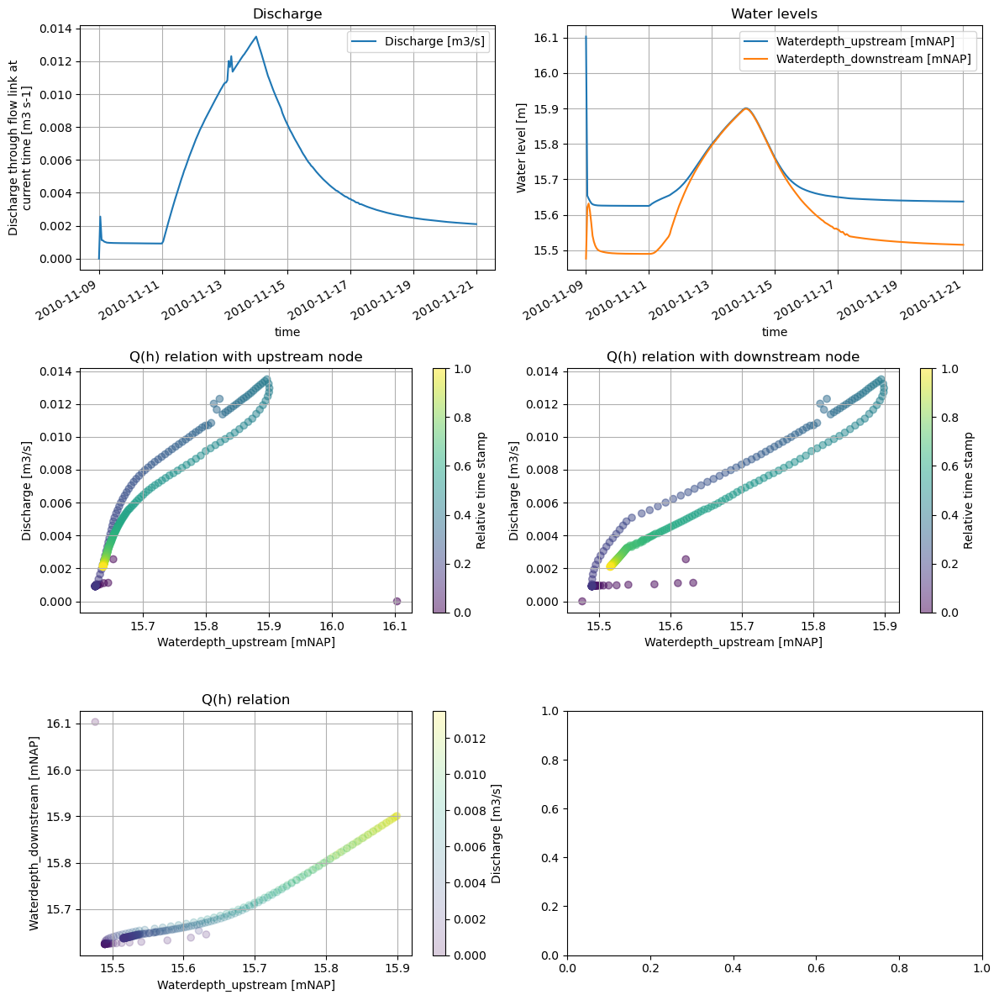

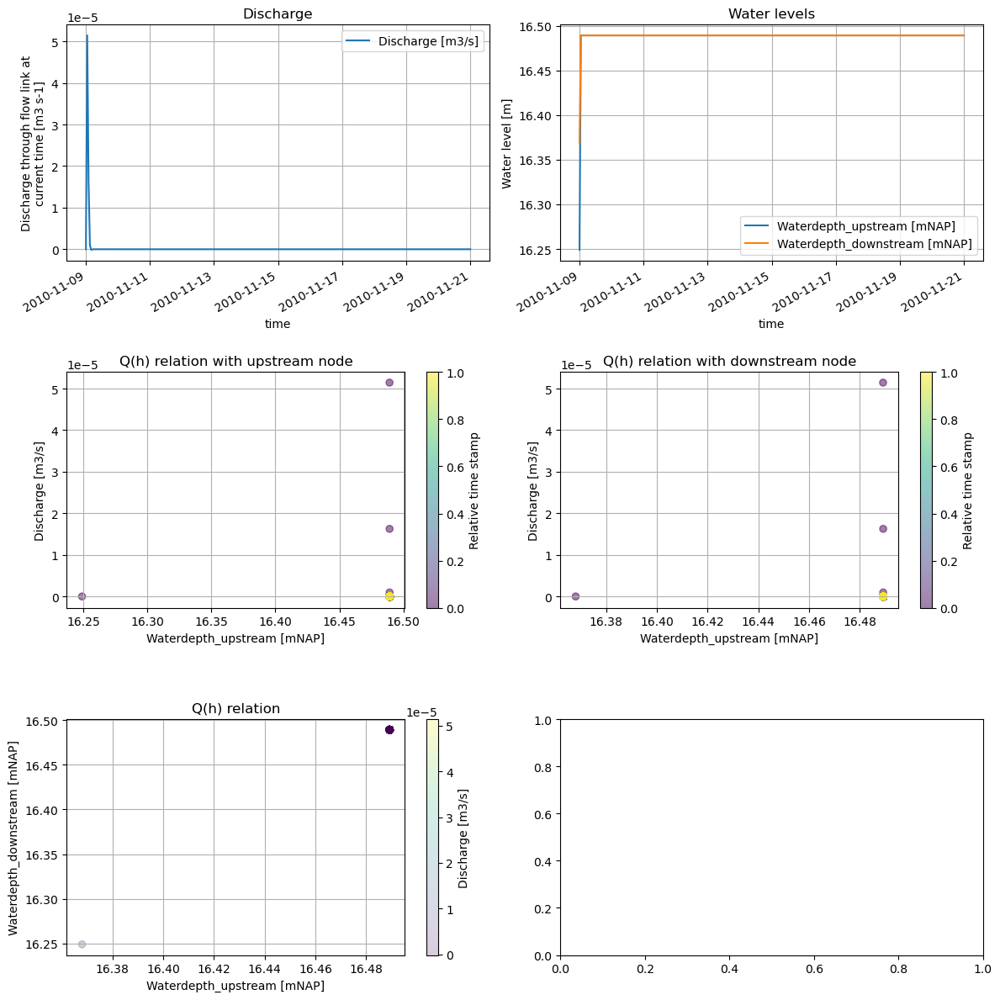

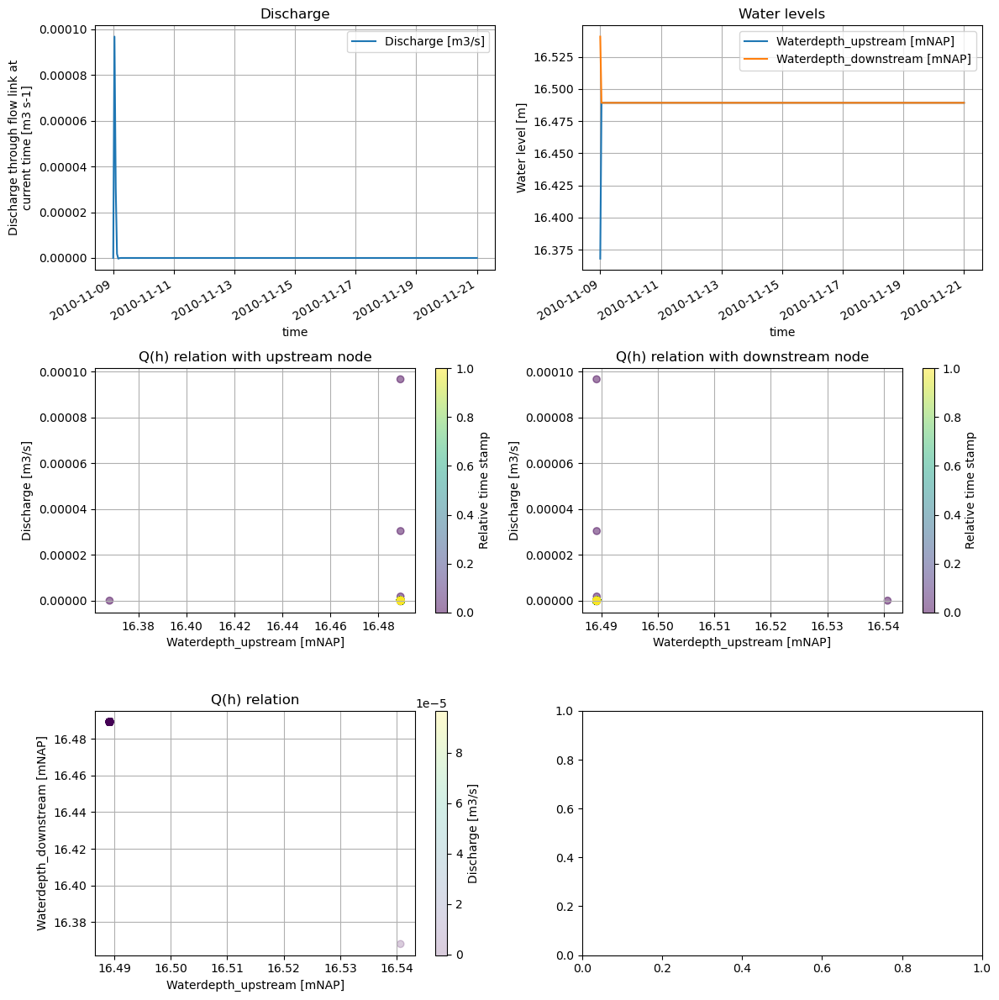

In [8]:
for i in range(35):
    plot_Q_h(Q = map_file['mesh1d_q1'],
         h = map_file['mesh1d_s1'],
         edges = map_file['mesh1d_edge_nodes'],
         edge_n = i)

# TabulatedRatingCurve

### In progress

In [9]:
# TRC_path = r"D:\Users\Bruijns\Documents\TKI Ribasim\Modellen\HogeRaam\Project1.dsproj_data\DFM\input\Hooge Raam_net.nc"
# TRC = xr.open_dataset(TRC_path)
# print(list(TRC.keys()))

# Attribute converter

## TRC, Basins, edges

In [33]:
#Convert the coordinates of all calculation points to Basin Nodes. #basins, edges, TRC
def attribute_converter(x_coordinates_nodes, 
                        y_coordinates_nodes, 
                        edges):
    
    
    #coordinates of the basin
    basins = pd.DataFrame()
    basins['x_coordinate'], basins['y_coordinate'] = x_coordinates_nodes, y_coordinates_nodes
    #to do: add name of each node here
    basins = gpd.GeoDataFrame(basins, geometry = gpd.points_from_xy(basins['x_coordinate'], basins['y_coordinate']))
    # basins['geometry'] = (x_coordinates_nodes, y_coordinates_nodes)

    #To do: robuuster maken. Gelijk vanaf het begin naam van nodes en edges toevoegen, en op basis daarvan indexen
    basins['NAME_ID'] = ['basin_{}'.format(i) for i in range(1, len(basins) + 1)] #naam geven
    basins['type'] = 'Basin'
    # basins.set_index('NAME_ID', inplace=True)
    
    #coordinates of the TabulatedRatingCurve. Should be, for now, in the middle of two nodes
    TRC = pd.DataFrame(columns = ['x_s_node', 'y_s_node', 'x_e_node', 'y_e_node', 'x_TRC', 'y_TRC', 'from_node', 'to_node', 'type'], index = range(len(edges))) #x & y location of Starting and End node
    edges = np.array(edges)
    x_coordinates_nodes = np.array(x_coordinates_nodes)
    y_coordinates_nodes = np.array(y_coordinates_nodes)
    
    for i in range(len(edges)):
        start_node = np.array(edges[i])[0] - 1 #minus one since it starts counting at 1 instead of 0
        end_node = np.array(edges[i])[1] - 1 #minus one since it starts counting at 1 instead of 0  

        #filling the TabulatedRatingCurve
        TRC.loc[i, 'x_s_node'], TRC.loc[i, 'y_s_node'] = x_coordinates_nodes[start_node], y_coordinates_nodes[start_node] #filling coordinates of starting node
        TRC.loc[i, 'x_e_node'], TRC.loc[i, 'y_e_node'] = x_coordinates_nodes[end_node], y_coordinates_nodes[end_node] #filling coordinates of ending nodes

        TRC.loc[i, 'from_node'], TRC.loc[i, 'to_node'] = basins.NAME_ID.iloc[start_node], basins.NAME_ID.iloc[end_node]
        
    TRC['x_TRC'] = (TRC['x_s_node'] + TRC['x_e_node']) / 2
    TRC['y_TRC'] = (TRC['y_s_node'] + TRC['y_e_node']) / 2
    TRC['type'] = 'TabulatedRatingCurve'
    TRC['NAME_ID'] = ['TRC_{}'.format(i) for i in range(1, len(TRC) + 1)] #naam geven
    
    TRC = gpd.GeoDataFrame(TRC, geometry = gpd.points_from_xy(TRC['x_TRC'], TRC['y_TRC']))

    
    #lines
    # Create a new GeoDataFrame
    lines = gpd.GeoDataFrame()

    # Create start and end points columns in the GeoDataFrame
    lines['start'] = gpd.points_from_xy(TRC['x_s_node'], TRC['y_s_node'])
    lines['end'] = gpd.points_from_xy(TRC['x_e_node'], TRC['y_e_node'])
    lines['from_node'], lines['to_node'] = TRC['from_node'], TRC['to_node']

    # Create lines by combining the start and end points
    lines['geometry'] = [LineString([start, end]) for start, end in zip(lines['start'], lines['end'])]
    lines = lines[['from_node', 'to_node', 'geometry']]



    return TRC, basins, lines

In [34]:
TRC, basins, edges = attribute_converter(x_coordinates_nodes = map_file['mesh1d_node_x'], 
                                         y_coordinates_nodes = map_file['mesh1d_node_y'], 
                                         edges = map_file['mesh1d_edge_nodes'])
    

In [35]:
edges

,from_node,to_node,geometry
0,basin_1,basin_2,"LINESTRING (177715.059 414111.585, 177697.256 ..."
1,basin_3,basin_4,"LINESTRING (178642.635 415429.560, 178640.851 ..."
2,basin_5,basin_6,"LINESTRING (175119.651 412669.387, 175122.830 ..."
3,basin_7,basin_8,"LINESTRING (178306.692 411025.119, 178296.200 ..."
4,basin_8,basin_9,"LINESTRING (178296.200 411041.110, 178285.824 ..."
...,...,...,...
2583,basin_2585,basin_2586,"LINESTRING (176111.792 413935.428, 176104.749 ..."
2584,basin_2586,basin_2587,"LINESTRING (176104.749 413959.404, 176097.706 ..."
2585,basin_2587,basin_2588,"LINESTRING (176097.706 413983.380, 176090.664 ..."
2586,basin_2588,basin_2589,"LINESTRING (176090.664 414007.356, 176083.621 ..."


# Filling Q(h) tables

In [36]:
def fill_Q_h(Q, h, edges, TRC, upstream = True): #Add TRC for the names
    TRC_table = pd.DataFrame(columns=['Q', 'h', 'basin_node']) #Q will be converted to V later

    
    for i in range(35):
    # for i in range(len(TRC)):
        temp_TRC_table = pd.DataFrame(columns=['Q', 'h', 'basin_node'])
        
        if upstream == True:
            node = np.array(edges[i])[0] - 1 #minus one since it starts counting at 1 instead of 0
        else:
            node = np.array(edges[i])[1] - 1 #minus one since it starts counting at 1 instead of 0  
        
        Q_basin = Q[:,node] #retrieve Q from a specific basin. 
        temp_TRC_table['Q'] = Q_basin.values
        
        h_basin = h[:,node] #retrieve h from a specific basin. 
        temp_TRC_table['h'] = h_basin.values
        
        temp_TRC_table['basin_node'] = 'basin_'+str(node + 1) #giving back its original name
        
        #add temp tabel to parent tabel
        TRC_table = pd.concat([TRC_table, temp_TRC_table])

    return TRC_table

In [37]:
TRC_table = fill_Q_h(Q = map_file['mesh1d_q1'], 
                     h = map_file['mesh1d_s1'], 
                     edges = map_file['mesh1d_edge_nodes'], 
                     TRC = TRC, 
                     upstream = True)



In [38]:
def BoundaryNode_Terminal(x_coordinates_nodes, y_coordinates_nodes, edges):                                                                #BoundaryNode was eerste LevelControl
    edges = edges.values #n times 2 array
    unique_first = np.unique(edges[:, 0]) # Get the unique integers from the first column
    unique_second = np.unique(edges[:, 1]) # Get the unique integers from the second column
    
    
    #Fill LevelControl with coordinates
    LevelControl_basins = np.setdiff1d(unique_first, unique_second) #= the basins which are assumed to be LevelControls 
    LevelControl_df = pd.DataFrame(columns = ['NAME_ID', 'type', 'x_coor', 'y_coor', 'basin_n'])
    LevelControl_df['NAME_ID'] = ['BoundaryNode_{}'.format(i) for i in range(len(LevelControl_basins))] #naam geven
    
    LevelControl_df.basin_n= LevelControl_basins
    LevelControl_df.x_coor = x_coordinates_nodes[LevelControl_basins-1].values
    LevelControl_df.y_coor = y_coordinates_nodes[LevelControl_basins-1].values
    LevelControl_df.type = 'BoundaryNode'

    LevelControl_gdf = gpd.GeoDataFrame(LevelControl_df[['NAME_ID', 'type', 'basin_n']], geometry = gpd.points_from_xy(LevelControl_df.x_coor, LevelControl_df.y_coor))
    BoundaryNode_gdf = LevelControl_gdf
    
    #Fill Terminal with coordinates
    Terminal_basins = np.setdiff1d(unique_second, unique_first) #= the basins which are assumed to be Terminals
    Terminal_df = pd.DataFrame(columns = ['NAME_ID', 'type', 'x_coor', 'y_coor', 'basin_n'])
    Terminal_df['NAME_ID'] = ['Terminal_{}'.format(i) for i in range(len(Terminal_basins))] #naam geven
   
    Terminal_df.basin_n= Terminal_basins
    Terminal_df.x_coor = x_coordinates_nodes[Terminal_basins-1].values
    Terminal_df.y_coor = y_coordinates_nodes[Terminal_basins-1].values
    Terminal_df.type = 'Terminal'
    
    Terminal_gdf = gpd.GeoDataFrame(Terminal_df[['NAME_ID', 'type', 'basin_n']], geometry = gpd.points_from_xy(Terminal_df.x_coor, Terminal_df.y_coor))
        
        
        
    return BoundaryNode_gdf, Terminal_gdf

In [39]:
BoundaryNode, Terminal = BoundaryNode_Terminal(x_coordinates_nodes = map_file['mesh1d_node_x'],
                                               y_coordinates_nodes = map_file['mesh1d_node_y'],
                                               edges = map_file['mesh1d_edge_nodes'])


# Filter basins based on LevelControl

In [40]:
#There are duplicate points between LevelControl and basins, which will be removed by following code

def filter_basins_LevelControl(basins, LevelControl):
    # Convert the 'basin_n' column to string in the LevelControl GeoDataFrame
    LevelControl['basin_n'] = LevelControl['basin_n'].astype(str)

    # Extract the basin numbers from the 'basin_n' column
    basin_numbers = LevelControl['basin_n'].tolist()

    # Filter the rows in the basins GeoDataFrame based on the 'NAME_ID' column
    filtered_basins = basins[basins['NAME_ID'].str.extract('(\d+)', expand=False).astype(str).isin(basin_numbers)]

    # Drop the selected rows from the basins GeoDataFrame
    filtered_basins = basins.drop(filtered_basins.index)
    
    return filtered_basins

In [41]:
# Filter first the Upstream Boundary nodes out of the basins
filtered_basins = filter_basins_LevelControl(basins = basins, 
                                             LevelControl = BoundaryNode)

# Filter secondly the Terminal(s) out of the basins
filtered_basins = filter_basins_LevelControl(basins = filtered_basins, 
                                             LevelControl = Terminal)

In [42]:
Terminal

,NAME_ID,type,basin_n,geometry
0,Terminal_0,Terminal,482,POINT (179556.917 416642.992)
1,Terminal_1,Terminal,913,POINT (177632.151 412071.535)


## Store output

In [43]:
filtered_basins = filtered_basins[['NAME_ID', 'type', 'geometry']]
TRC = TRC[['NAME_ID', 'type', 'geometry']]#, 'from_node', 'to_node'] #zou voor duidelijkheid erbij kunnen, maar voor nu from_node en to_node eruit gelaten

TRC.to_file(r'Results\Attribute_converter\TRC.shp', crs = 'EPSG:28992')
filtered_basins.to_file(r'Results\Attribute_converter\basins.shp', crs = 'EPSG:28992')
edges.to_file(r'Results\Attribute_converter\Edges.shp', crs = 'EPSG:28992')
BoundaryNode.to_file(r'Results\Attribute_converter\LevelControl_under_construction.shp', crs = 'EPSG:28992')
Terminal.to_file(r'Results\Attribute_converter\basins_under_construction.shp', crs = 'EPSG:28992')

TRC_table.to_csv(r'Results\Attribute_converter\TabulatedRatingCurve.csv')

nodes = pd.concat([basins, TRC, BoundaryNode, Terminal])
nodes.to_file(r'Results\Attribute_converter\Node.gpkg', driver = 'GPKG', crs = 'EPSG:28992')

# Profiles

In [80]:
#dummy profiles for a drainage calculation
profiles1 = pd.DataFrame(columns=['node_id', 'storage', 'area', 'level'])
profiles1.node_id = np.arange(1, len(filtered_basins)+1)
profiles1.storage = 0
profiles1.area = 0
profiles1.level = 0

profiles2 = profiles1.copy(deep = True)
profiles2.storage = 1000
profiles2.area = 100
profiles2.level = 10

profiles = pd.concat([profiles1, profiles2])
profiles.sort_values(by = ['node_id', 'storage'], inplace = True)

# Static forcing

In [83]:
#dummy forcing for a drainage calculation


seconds_in_day = 24 * 3600
precipitation = 0.000 / seconds_in_day
evaporation = 0.000 / seconds_in_day

static = pd.DataFrame(columns= ["node_id", "drainage", "potential_evaporation", "infiltration", "precipitation", "urban_runoff"])
static.node_id = np.arange(1, len(filtered_basins)+1)
static = static.fillna(0)
static

,node_id,drainage,potential_evaporation,infiltration,precipitation,urban_runoff
0,1,0,0,0,0,0
1,2,0,0,0,0,0
2,3,0,0,0,0,0
3,4,0,0,0,0,0
4,5,0,0,0,0,0
...,...,...,...,...,...,...
2544,2545,0,0,0,0,0
2545,2546,0,0,0,0,0
2546,2547,0,0,0,0,0
2547,2548,0,0,0,0,0


In [ ]:
basin = ribasim.Basin(profile=profile, static=static)

# Fractional flow

In [21]:
def FractionalFlow(Q, mesh1d_edge_nodes, h, n = 3):
    mesh1d_edge_nodes_f = np.array(mesh1d_edge_nodes).flatten() # flatten the array to a 1D array
    counts = np.bincount(mesh1d_edge_nodes_f) # count the occurrences of each integer
    bifurcations_confluences = np.where(counts > 2)[0]     # get the integers that occur more than twice
    
    
    #voor nu even een voorbeeld waar ik node 3 (2) neem
    rows_with_bicon = mesh1d_edge_nodes[(mesh1d_edge_nodes == n).any(axis=1)] #start and end point of each edge
    indices_with_bicon = np.where(mesh1d_edge_nodes == n)[0] #the corresponding edge
    
    # print(rows_with_bicon)
    # print(indices_with_bicon)
    
    #a bifurcatioin or confluence has usual three edges. However, in case it has more, it is convenient to put it in a loop to avoid missing edges.
    
    flow_to_node, flow_from_node = [], [] #to store the discharges to and from the nodes
    
    # n = corresponding node
   
    count_from, count_to = 0, 0
 
    #plotten tweede rij
    plt.figure(figsize = (10, 10))
    plt.subplot(4, 1, 1)
    
    for j in range(len(indices_with_bicon)):
        
        if rows_with_bicon[j][0] == n: #if the first value of the rows_with_bicon[j] is equal to the node of interest, it means the discharge flows away from the node...
            flow_from_node.append(np.array(Q[:, indices_with_bicon[j]])) #... which means the indices_with_bicon (which corresponds to the edge, and thus discharge) should be added to the flow_from_node 
            flow_from_node[count_from] = np.where(flow_from_node[count_from] < 0.001, np.nan, flow_from_node[count_from]) #test, kijken of dit duidelijker wordt
            plt.plot(flow_from_node[count_from], label = 'flow_from_node')
            count_from +=1
            
        elif rows_with_bicon[j][1] == n:
            flow_to_node.append(np.array(Q[:, indices_with_bicon[j]]))
            flow_to_node[count_to] = np.where(flow_to_node[count_to] < 0.001, np.nan, flow_to_node[count_to]) #test, kijken of dit duidelijker wordt
            plt.plot(flow_to_node[count_to], label = 'flow_to_node')
            count_to +=1
            
        else:
            raise ValueError('The found nodes do not correspond with rows_with_bicon') #later weghalen, is een check voor mezelf
                                
    plt.legend()
    plt.grid()
    plt.title('Discharges, sample =' + str (n))
    plt.xlim(0, 750)
    plt.xlabel('Timestep')
    plt.tight_layout()
    
    
    q_in = sum(flow_to_node)
    q_out = sum(flow_from_node)
    
    FF_to_node, FF_from_node = [], []
    
    for j in range(len(flow_to_node)):
        FF = flow_to_node[j] / q_in
        FF_to_node.append(FF)
        
    for j in range(len(flow_from_node)):
        FF = flow_from_node[j] / q_out
        FF_from_node.append(FF) 
    
    #plotten tweede rij
    plt.figure(figsize = (10, 10))
    plt.subplot(4, 1, 2)
    plt.plot(q_in, label = 'q_in_total', lw = 2)
    plt.plot(q_out, label = 'q_out_total', ls = '--')
    plt.legend()
    plt.grid()
    plt.title('Discharges, sample =' + str (n))
    plt.xlim(0, 750)
    plt.xlabel('Timestep')
    plt.tight_layout()
    
    #plotten derde rij 
    #loop through both inflow and outlfow, plot the fractional flow, and plot
    plt.figure(figsize = (10, 10))
    plt.subplot(4,1,3)
    plt.title('Fractional Flow, sample = ' + str(n))
    for j in range(len(FF_to_node)):
        plt.plot(FF_to_node[j], label = 'FractionalFlow q_in_'+str(j))
    for j in range(len(FF_from_node)):
        plt.plot(FF_from_node[j], label = 'FractionalFlow q_out_'+str(j))
    plt.legend()
    plt.grid()
    plt.xlim(0, 750)
    plt.xlabel('Timestep')
    plt.tight_layout()
    
    
    #vierde rij. Hier moet uiteindelijk de FF relatie met h komen
    plt.figure(figsize = (10, 10))
    plt.subplot(4, 1, 4)
    for j in range(len(flow_to_node)):
        plt.scatter(x = h[:, n],
                    y = FF_to_node[j],
                    label = 'FF to node, ' + str(j),
                    alpha = 0.5)
    for j in range(len(FF_from_node)):
        plt.scatter(x = h[:, n],
                    y = FF_from_node[j],
                    label = 'FF from node, ' + str(j),
                    alpha = 0.5)
    plt.legend()
    plt.grid()
    plt.xlabel('Water level [mNAP]')
    plt.ylabel('Fractional flow [-]')
    plt.title('Fractional Flow over height')
    plt.tight_layout()
    # plt.show()    
    # print('q_out =', q_out)
    # start_node = 7 - 1
    # end_node1 = 8-1
    # end_node2 = 2598-1
                        
#     q1 = Q[:, indices_with_3[0]]
#     q2 = Q[:, indices_with_3[1]]
#     q3 = Q[:, indices_with_3[2]]
#     q4 = abs(q1) + abs(q2)
    
#     q1.plot()
#     q2.plot()
#     q3.plot()
#     q4.plot.line('--')
    # print(bifurcations_confluences)

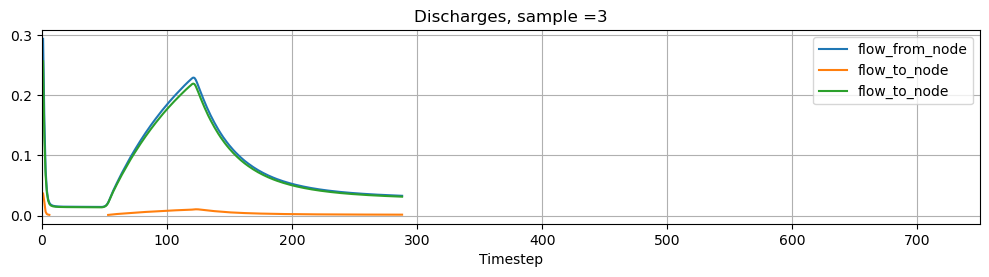

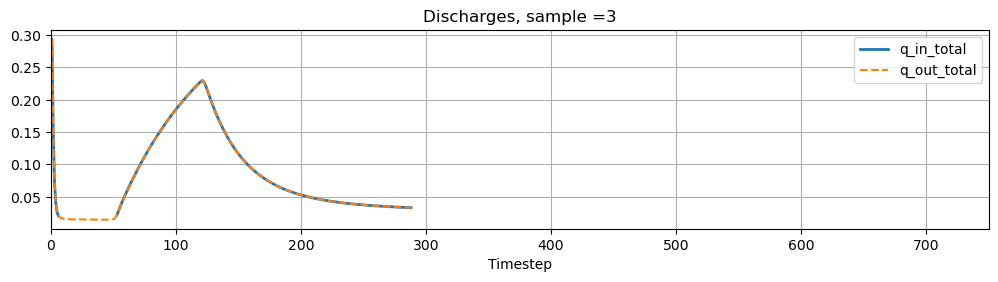

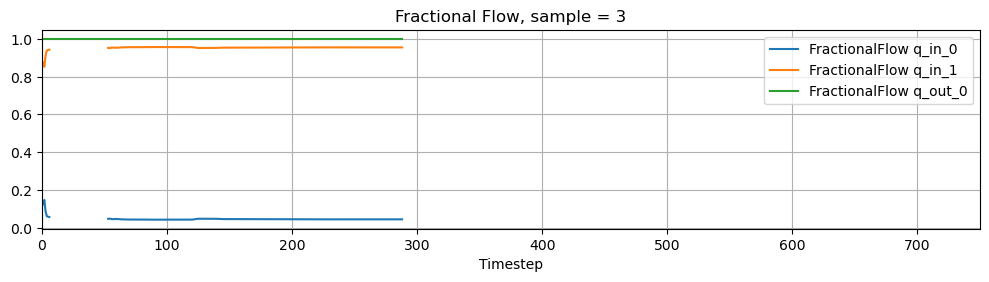

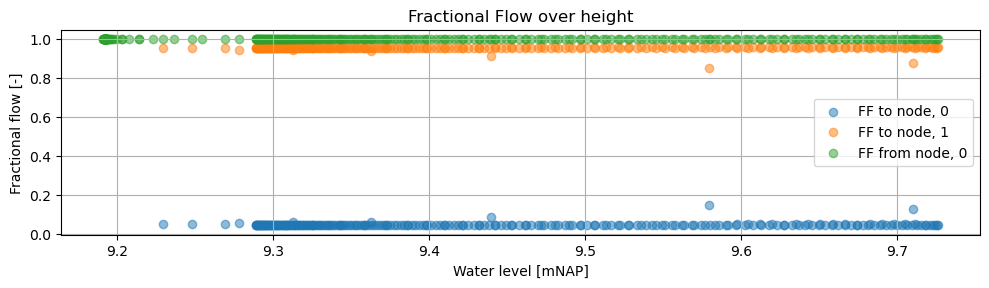

In [22]:
FractionalFlow(Q = map_file['mesh1d_q1'], 
               mesh1d_edge_nodes = map_file['mesh1d_edge_nodes'],
               h = map_file['mesh1d_s1'],
               n = 3)

C:\Users\Bruijns\AppData\Local\Temp\ipykernel_11896\4169101723.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10, 10))


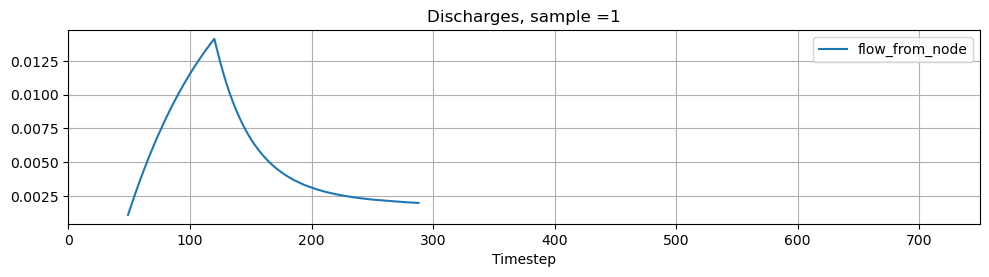

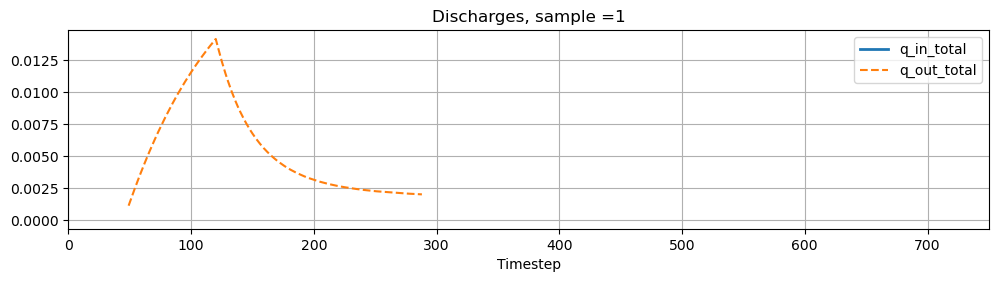

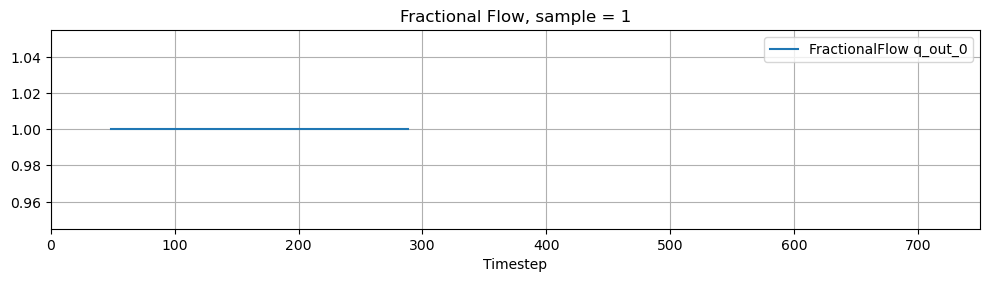

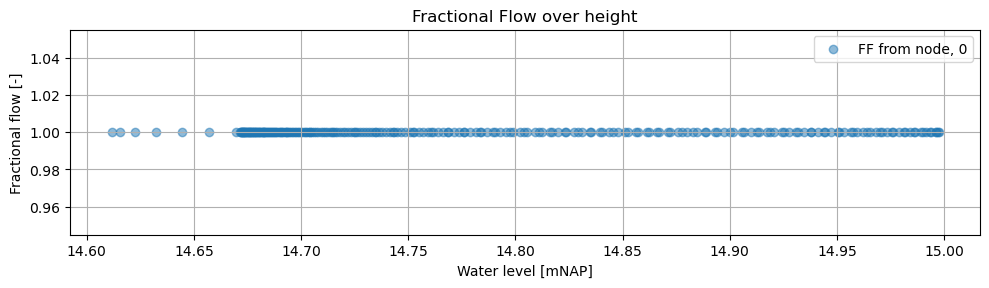

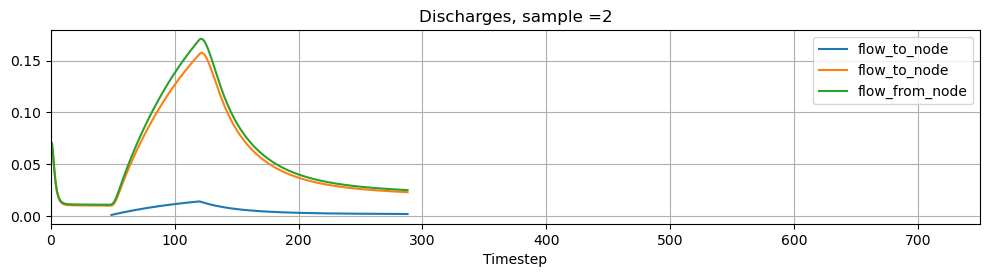

...

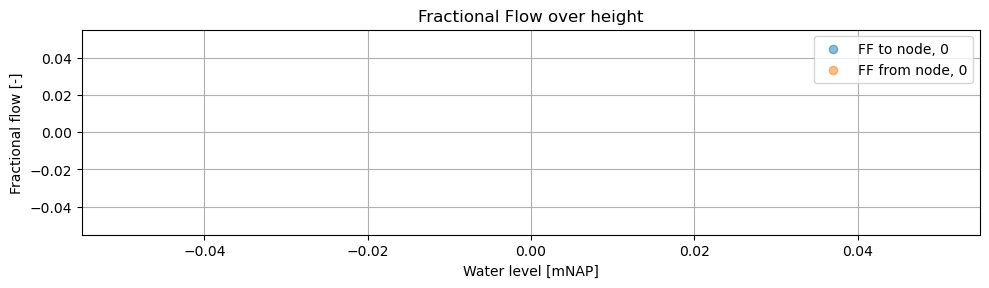

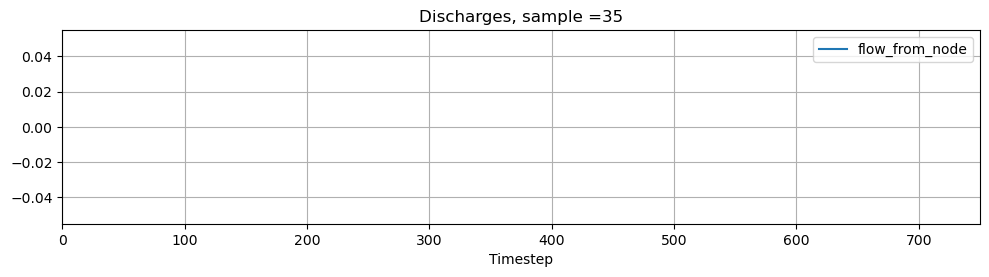

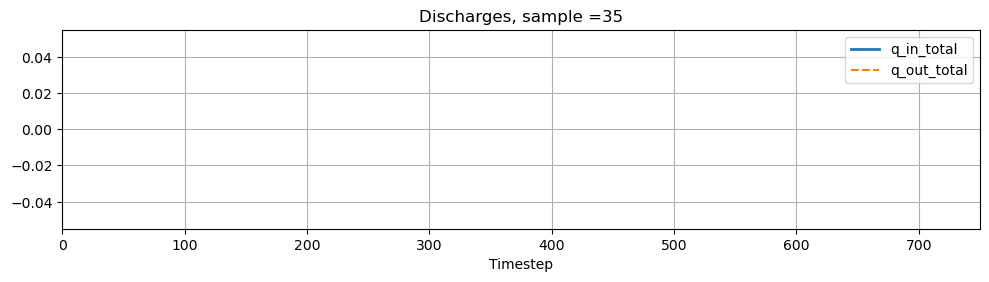

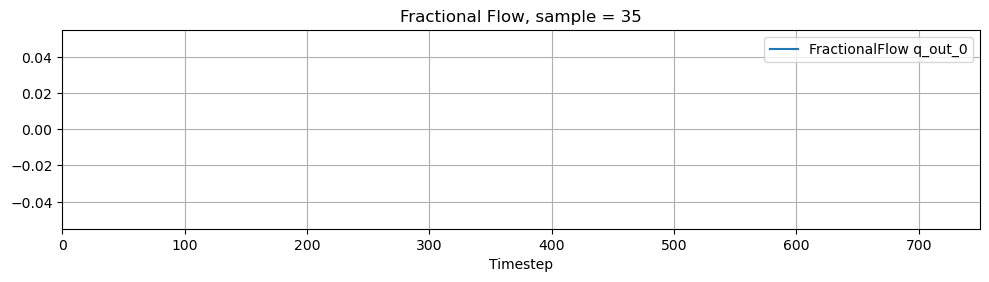

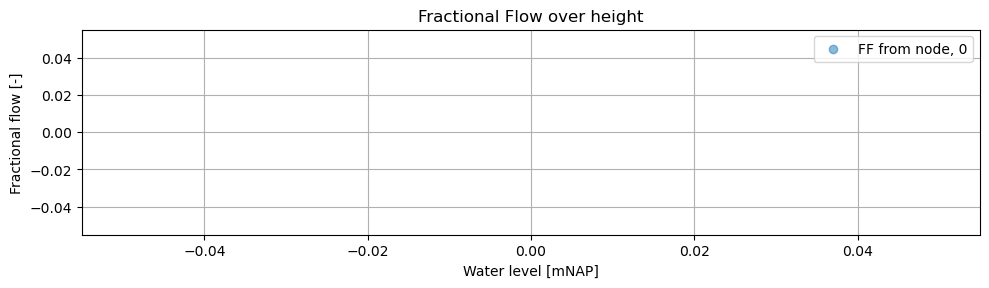

In [23]:
for i in range(35):
    FractionalFlow(Q = map_file['mesh1d_q1'], 
               mesh1d_edge_nodes = map_file['mesh1d_edge_nodes'],
               h = map_file['mesh1d_s1'],
               n = i+1)

# python Ribasim

## Set up the nodes

In [45]:
# correcte benaming kolommen. to do: aggeregeren met voorgaande blokken code tot één overzicht
basins.loc[:, 'fid'] = np.arange(1, len(basins)+1) 
basins = basins.set_index('fid')
basins = 

In [46]:
node = ribasim.Node(static = gpd.GeoDataFrame(
                    data = basins['type'],
                    index = basins.index,
                    geometry = basins.geometry,
                    crs = 'EPSG:28992')
                    )

In [53]:
terminal = Terminal.loc[Terminal.basin_n == 482]
terminal = ribasim.Terminal(static=terminal)

AttributeError: module 'ribasim' has no attribute 'Terminal'

In [55]:
#Setup a model

model = ribasim.Model(
    modelname="basic",
    node=node,
    edge=edge,
    basin=basin,
    level_boundary=level_boundary,
    flow_boundary=flow_boundary,
    pump=pump,
    linear_resistance=linear_resistance,
    manning_resistance=manning_resistance,
    tabulated_rating_curve=rating_curve,
    fractional_flow=fractional_flow,
    terminal=terminal,
    starttime="2020-01-01 00:00:00",
    endtime="2021-01-01 00:00:00",
)

SyntaxError: unmatched ')' (4059491298.py, line 1)

In [ ]:
model.plot()


# Experiments

In [ ]:
map_file.mesh1d_waterdepth

In [ ]:
#wd = waterdepth
waterdepth = map_file['mesh1d_s1']
wd0 = waterdepth[:, 0]
wd1 = waterdepth[:, 1]
wd372 = waterdepth[:, 372]
wd2048 = waterdepth[:, 2048]

In [ ]:
wd0.plot()
wd1.plot()

wd372.plot()
wd2048.plot()

In [ ]:
list(map_file.keys())

# Trash

In [ ]:
with open(binfile, 'rb') as file:
    # do something with the file object, e.g. read the content
    content = file.read()
    
    




In [ ]:
count = 0
listed = []
for line in content:
    count += 1
    if count > 1000:
        break
        
    else:
        print(line)
        
# print(listed)
        
content.close()


In [ ]:
a = pickle.loads(r"D:\Users\Bruijns\Documents\TKI Ribasim\Modellen\ValleiVeluwe\DHYDRO_20230407_1D_geenRTC_geenRR_dynamisch_30_dagen\fm\Vallei_tbl.bin")

In [ ]:
import io

In [ ]:
f = open(r"D:\Users\Bruijns\Documents\TKI Ribasim\Modellen\ValleiVeluwe\DHYDRO_20230407_1D_geenRTC_geenRR_dynamisch_30_dagen\fm\Vallei_tbl.bin","rb")
bin_data = f.read()
sio = io.StringIO(bin_data)
graph_data = pickle.load(sio)

In [ ]:
fn = r"D:\Users\Bruijns\Documents\TKI Ribasim\Modellen\ValleiVeluwe\DHYDRO_20230407_1D_geenRTC_geenRR_dynamisch_30_dagen\fm\output_dimr\Vallei_his.nc"
newds = nc.Dataset(fn)
newds

In [ ]:
#oude manier van plotten

def plot_Q_h(Q, h, edges, edge_n, threeD = False):
    """
    Plot the Q of a specified edge, and the corresponding h of the nodes  
    
    Parameters
    ----------
    Q : mesh1d_q1
    h : mesh1d_s1
    edges : mesh1d_edge_nodes
    edge_n : edge number to be looked into
    
    Returns
    ----------
    Plots
    """
    
    start_node = np.array(edges[edge_n])[0] - 1 #minus one since it starts counting at 1 instead of 0
    end_node = np.array(edges[edge_n])[1] - 1 #minus one since it starts counting at 1 instead of 0
    
                        
    q1 = Q[:, edge_n] #dicharge at the defined edge_n
    
    #upper left, discharge
    plt.figure(figsize = (15, 10))
    plt.subplot(3,2,1)
    q1.plot(label='Discharge')
    plt.legend()
    plt.grid()
    
    #upper right, waterlevels
    h_up = h[:, start_node]
    h_down = h[:, end_node]
    
    plt.subplot(3,2,2)
    h_up.plot(label='Waterdepth_upstream')
    h_down.plot(label='Waterdepth_downstream')
    plt.legend()
    plt.grid()
    
    #lower left, Qh upstream
    plt.subplot(3,2,3)
    plt.scatter(x = h_up,
                y = q1,
                c =plt.cm.viridis(np.linspace(0, 1, len(h_up))),
                alpha = 0.5)
    plt.title('Q(h) relation with upstream node')
    plt.grid()
    
    #lower right, Qh downstream
    plt.subplot(3,2,4)
    plt.scatter(x = h_down,
                y = q1)
    plt.title('Q(h) relation with upstream node')
    plt.grid()   
    plt.tight_layout()
    
    
    #Qh relation   
    plt.subplot(3,2,5)
    plt.scatter(x= h_down,
                y = h_up,
                c = q1,
                alpha = 0.2)
    plt.title('Q(h)-relation')
    plt.xlabel('H_down')
    plt.ylabel('H_up')
    plt.colorbar(label = 'Discharge')
    plt.grid()
    plt.tight_layout()
    
    if threeD == True:
        size = 0.01
        fig = plt.figure(figsize=(8, 3))

        colors = q1 / np.max(q1)  # normalize q1 values to [0, 1] range

        ax.bar3d(x = np.array(h_up),
                 y = np.array(h_down),
                 z = np.zeros_like(q1),
                 dx = np.ones_like(h_up)*size,
                 dy = np.ones_like(h_up)*size,
                 dz = np.array(q1),
                 color=plt.cm.viridis(colors),
                 alpha = 0.2)
        # ax.view_init(elev=30, azim=45)
        # Set the axis labels
        ax.set_xlabel('h_up')
        ax.set_ylabel('h_down')
        ax.set_zlabel('q1')

        # Adjust the viewing angle
        ax.view_init(roll=0)

        # Add grid lines
        ax.grid(True)
    
    plt.show()
    
    
    #check whether the coordinates of the the edges and node correspond
    snxl, snyl = h[:, start_node].mesh1d_node_x.values, h[:, start_node].mesh1d_node_y.values
    enxl, enyl = h[:, end_node].mesh1d_node_x.values, h[:, end_node].mesh1d_node_y.values
    exl, eyl = Q[:, edge_n].mesh1d_edge_x.values, Q[:, edge_n].mesh1d_edge_y.values
    
    x, y = True, True
    
    if exl > np.mean([snxl, enxl])+1 or exl < np.mean([snxl, enxl])-1:
        x = False
    elif eyl > np.mean([snyl, enyl])+1 or eyl < np.mean([snyl, enyl])-1:
        y = False
        
    if x == False or y == False:    
        print('x =', x)
        print('y =', y)
        print('Edge x location: ', int(Q[:, edge_n].mesh1d_edge_x.values))
        print('Edge y location: ', int(Q[:, edge_n].mesh1d_edge_y.values))
        print()
        print('Start node x location: ', int(h[:, start_node].mesh1d_node_x.values))
        print('Start node y location: ', int(h[:, start_node].mesh1d_node_y.values))
        print()
        print('End node x location: ', int(h[:, end_node].mesh1d_node_x.values))
        print('End node y location: ', int(h[:, end_node].mesh1d_node_y.values))
    else:
        print('Coordinates of the nodes and edges are likely to be correct')
    
                           
                    def plot_Q_h(Q, h, edges, edge_n, threeD = False):
    """
    Plot the Q of a specified edge, and the corresponding h of the nodes  
    
    Parameters
    ----------
    Q : mesh1d_q1
    h : mesh1d_s1
    edges : mesh1d_edge_nodes
    edge_n : edge number to be looked into
    
    Returns
    ----------
    Plots
    """
    
    start_node = np.array(edges[edge_n])[0] - 1 #minus one since it starts counting at 1 instead of 0
    end_node = np.array(edges[edge_n])[1] - 1 #minus one since it starts counting at 1 instead of 0
    
                        
    q1 = Q[:, edge_n] #dicharge at the defined edge_n
    
    #upper left, discharge
    plt.figure(figsize = (15, 10))
    plt.subplot(3,2,1)
    q1.plot(label='Discharge')
    plt.legend()
    plt.grid()
    
    #upper right, waterlevels
    h_up = h[:, start_node]
    h_down = h[:, end_node]
    
    plt.subplot(3,2,2)
    h_up.plot(label='Waterdepth_upstream')
    h_down.plot(label='Waterdepth_downstream')
    plt.legend()
    plt.grid()
    
    #lower left, Qh upstream
    plt.subplot(3,2,3)
    plt.scatter(x = h_up,
                y = q1,
                c =plt.cm.viridis(np.linspace(0, 1, len(h_up))),
                alpha = 0.5)
    plt.title('Q(h) relation with upstream node')
    plt.grid()
    
    #lower right, Qh downstream
    plt.subplot(3,2,4)
    plt.scatter(x = h_down,
                y = q1)
    plt.title('Q(h) relation with upstream node')
    plt.grid()   
    plt.tight_layout()
    
    
    #Qh relation   
    plt.subplot(3,2,5)
    plt.scatter(x= h_down,
                y = h_up,
                c = q1,
                alpha = 0.2)
    plt.title('Q(h)-relation')
    plt.xlabel('H_down')
    plt.ylabel('H_up')
    plt.colorbar(label = 'Discharge')
    plt.grid()
    plt.tight_layout()
    
    if threeD == True:
        size = 0.01
        fig = plt.figure(figsize=(8, 3))

        colors = q1 / np.max(q1)  # normalize q1 values to [0, 1] range

        ax.bar3d(x = np.array(h_up),
                 y = np.array(h_down),
                 z = np.zeros_like(q1),
                 dx = np.ones_like(h_up)*size,
                 dy = np.ones_like(h_up)*size,
                 dz = np.array(q1),
                 color=plt.cm.viridis(colors),
                 alpha = 0.2)
        # ax.view_init(elev=30, azim=45)
        # Set the axis labels
        ax.set_xlabel('h_up')
        ax.set_ylabel('h_down')
        ax.set_zlabel('q1')

        # Adjust the viewing angle
        ax.view_init(roll=0)

        # Add grid lines
        ax.grid(True)
    
    plt.show()
    
    
    #check whether the coordinates of the the edges and node correspond
    snxl, snyl = h[:, start_node].mesh1d_node_x.values, h[:, start_node].mesh1d_node_y.values
    enxl, enyl = h[:, end_node].mesh1d_node_x.values, h[:, end_node].mesh1d_node_y.values
    exl, eyl = Q[:, edge_n].mesh1d_edge_x.values, Q[:, edge_n].mesh1d_edge_y.values
    
    x, y = True, True
    
    if exl > np.mean([snxl, enxl])+1 or exl < np.mean([snxl, enxl])-1:
        x = False
    elif eyl > np.mean([snyl, enyl])+1 or eyl < np.mean([snyl, enyl])-1:
        y = False
        
    if x == False or y == False:    
        print('x =', x)
        print('y =', y)
        print('Edge x location: ', int(Q[:, edge_n].mesh1d_edge_x.values))
        print('Edge y location: ', int(Q[:, edge_n].mesh1d_edge_y.values))
        print()
        print('Start node x location: ', int(h[:, start_node].mesh1d_node_x.values))
        print('Start node y location: ', int(h[:, start_node].mesh1d_node_y.values))
        print()
        print('End node x location: ', int(h[:, end_node].mesh1d_node_x.values))
        print('End node y location: ', int(h[:, end_node].mesh1d_node_y.values))
    else:
        print('Coordinates of the nodes and edges are likely to be correct')
    
                           
                    

In [ ]:
# Select a specific location
location = 35

# Extract the water levels and discharges for that location
waterlevels = map_file['mesh1d_s1'][:, location]
discharges = map_file['mesh1d_q1'][:, location]

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(waterlevels, discharges, range(len(waterlevels)))

# Set the axis labels
ax.set_xlabel('Water level')
ax.set_ylabel('Discharge')
ax.set_zlabel('Time')

# Show the plot
plt.show()